In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from wordcloud import WordCloud

In [4]:
import ast

In [5]:
data=pd.read_csv('zomato.csv')
# data.head(3)

In [145]:
data.rest_type.value_counts()[data.rest_type.value_counts()>10].nunique()

55

In [147]:
data[data.location=='Sankey Road']['name'].unique()

array(['La Brasserie - Le Meridien', 'La Boulangerie - Le Meridien',
       'The Sugar Factory - Le Meridien', 'Jashn - Le Meridien',
       'Sports Bar - Le Meridien', 'The Raj Pavilion - ITC Windsor',
       'Nandhini Deluxe', 'Fabelle Chocolate Boutique - ITC Windsor',
       'Royal Afghan - ITC Windsor', 'Dakshin - ITC Windsor',
       'Dum Pukht Jolly Nabobs - ITC Windsor', 'Dublin - ITC Windsor'],
      dtype=object)

In [6]:
data.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [7]:
def ui(x):
    try:
        return int(x.replace(',',''))
    except:
        pass



In [8]:
data['approx_cost(for two people)']=data['approx_cost(for two people)'].apply(lambda x:ui(x))

In [9]:
data.groupby('name')['approx_cost(for two people)'].transform('median').isna().sum()

145

In [10]:
data.drop(['address','url','phone'],axis=1,inplace=True)

In [11]:
data.drop_duplicates(inplace=True)

In [12]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                            7760
votes                              0
location                          21
rest_type                        227
dish_liked                     28027
cuisines                          45
approx_cost(for two people)      345
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [13]:
data.rate.replace(('NEW','-'),np.nan,inplace =True)
# first make it as string
data.rate = data.rate.astype('str')
# remove the "/5" 
data.rate = data.rate.apply(lambda x: x.replace('/5','').strip())
# convert column type to float
data.rate = data.rate.astype('float')

In [14]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                           10027
votes                              0
location                          21
rest_type                        227
dish_liked                     28027
cuisines                          45
approx_cost(for two people)      345
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [15]:
def get_rate(x):
    '''
    extract the rate value out of a string inside tuple
    '''
    # ensure that x is not Null and there is more than one rate
    if not eval(x) or len(eval(x)) <= 1:
        return None
    rate = [float(i[0].replace('Rated','').strip())  for i in eval(x) if type(i[0])== str]
    return round((sum(rate)/len(rate)),1)

In [16]:
data['review_rate']  = data.reviews_list.apply(lambda x : get_rate(x))

In [17]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                           10027
votes                              0
location                          21
rest_type                        227
dish_liked                     28027
cuisines                          45
approx_cost(for two people)      345
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
review_rate                    16092
dtype: int64

In [18]:
nan_index = data.query('rate != rate & review_rate == review_rate').index
for i in nan_index:
    data.loc[i,'rate'] = data.loc[i,'review_rate'] 

In [19]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                            8522
votes                              0
location                          21
rest_type                        227
dish_liked                     28027
cuisines                          45
approx_cost(for two people)      345
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
review_rate                    16092
dtype: int64

In [20]:
data.drop(columns='review_rate',axis=1,inplace=True)

In [21]:
data.shape

(51654, 14)

In [22]:
data.dropna(subset=['rate'],inplace=True)

In [23]:
data.dropna(subset=['rate', 'approx_cost(for two people)'],inplace=True)

In [24]:
data.shape[0]

42854

In [25]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                               0
votes                              0
location                           0
rest_type                        147
dish_liked                     19394
cuisines                           8
approx_cost(for two people)        0
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [26]:
data.dropna(subset=['rest_type', 'cuisines'],inplace=True)

In [27]:
data.shape


(42699, 14)

In [28]:
data.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                               0
votes                              0
location                           0
rest_type                          0
dish_liked                     19307
cuisines                           0
approx_cost(for two people)        0
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [29]:
data.reviews_list = data.reviews_list.apply(lambda x: ast.literal_eval(x))

In [30]:
def clear_text(t):
    '''
    clear the input text t
    '''
    return ' '.join([i[1].replace("RATED\n  ",'') for i in t]).encode('utf8').decode('ascii',errors='replace').\
           replace('?','').replace('�','').replace('\n','').replace('.',' ').strip().lower()

In [31]:
data['reviews_text'] = data.reviews_list.apply(lambda x: clear_text(x))

In [32]:
data.reviews_text[0][:500]

'a beautiful place to dine in the interiors take you back to the mughal era  the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available  but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again  i was here for dinner with my family on a weekday  the restaurant was completely empty  ambience is good with some good old hindi music  seating arrange'

In [33]:
data.dish_liked = data.dish_liked.apply(lambda x:x.lower().strip() if isinstance(x,str) else x)

In [34]:
menu_list = [e.strip() for i in data.dish_liked.tolist() if isinstance(i,str) and len(i) >0 for e in i.split(',')]

# Now collect the unique dish name 
menu_set = set(menu_list)

In [35]:
menu_set.intersection(data.reviews_text[10000].split(' '))

{'chicken', 'fish', 'mutton', 'rice', 'thali'}

In [36]:
data['dish_n_review'] = data.reviews_text.apply(lambda x: ', '.join(list(menu_set.intersection(x.split(' ')))))

In [37]:
nan_index = data.query('dish_liked != dish_liked & dish_n_review == dish_n_review').index
for i in nan_index:
    data.loc[i,'dish_liked'] = data.loc[i,'dish_n_review']

In [42]:
data.isnull().sum()

name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
location                       0
rest_type                      0
dish_liked                     0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
menu_item                      0
listed_in(type)                0
listed_in(city)                0
dtype: int64

In [43]:
data.shape

(42699, 14)

In [41]:
data.drop(['dish_n_review','reviews_text'],axis=1,inplace=True)

In [44]:
data.to_csv('C:\Zomato.csv', index=False)

In [217]:
data.shape

(42699, 16)

In [36]:
(1-data.shape[0]/51654)*100

17.336508305261933

In [37]:
data['approx_cost(for two people)']=data['approx_cost(for two people)'].apply(lambda x:x.replace(',','')).astype(int)

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42699 entries, 0 to 51716
Data columns (total 16 columns):
name                           42699 non-null object
online_order                   42699 non-null object
book_table                     42699 non-null object
rate                           42699 non-null float64
votes                          42699 non-null int64
location                       42699 non-null object
rest_type                      42699 non-null object
dish_liked                     42699 non-null object
cuisines                       42699 non-null object
approx_cost(for two people)    42699 non-null int32
reviews_list                   42699 non-null object
menu_item                      42699 non-null object
listed_in(type)                42699 non-null object
listed_in(city)                42699 non-null object
reviews_text                   42699 non-null object
dish_n_review                  42699 non-null object
dtypes: float64(1), int32(1), int64(1), obje

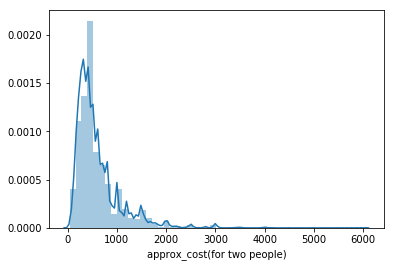

In [39]:
sns.distplot((data['approx_cost(for two people)']))

In [48]:
from PIL import Image  
import PIL

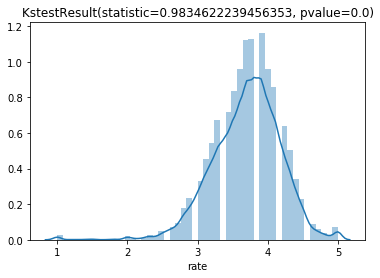

In [54]:
rate_dist=sns.distplot(data['rate'])
plt.title(stats.kstest(data['rate'], 'norm'))
#rate_dist.savefig('rate distribution.jpg')
rate_dist.figure.savefig('rate distribution.jpg') 

In [41]:
from scipy import stats
#stats.shapiro(data['rate'])
stats.kstest(data['rate'], 'norm')

KstestResult(statistic=0.9834622239456353, pvalue=0.0)

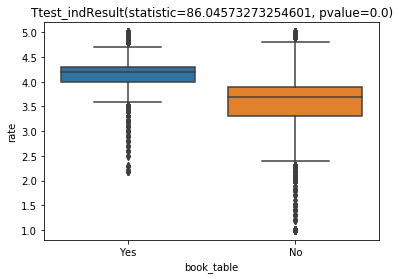

In [63]:
book_table=sns.boxplot(data['book_table'],data['rate'])
plt.title(stats.ttest_ind(a,b))
book_table.figure.savefig('book_table vs rate.jpg') 

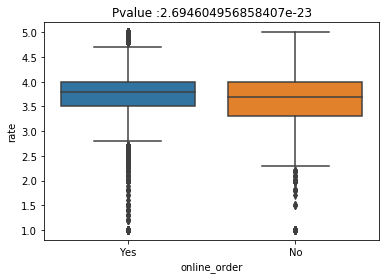

In [74]:
online_order=sns.boxplot(data['online_order'],data['rate'])
plt.title('Pvalue :{}'.format(stats.ttest_ind(c,d)[1]))
online_order.figure.savefig('online_order vs rate.jpg') 

In [42]:
a=data['rate'][data['book_table']=='Yes']
b=data['rate'][data['book_table']=='No']

In [43]:
stats.ttest_ind(a,b)

Ttest_indResult(statistic=86.04573273254601, pvalue=0.0)

In [45]:
c=data['rate'][data['online_order']=='Yes']
d=data['rate'][data['online_order']=='No']
print(stats.f_oneway(c,d))
stats.ttest_ind(c,d)

F_onewayResult(statistic=98.98699327669495, pvalue=2.6946049568834597e-23)


Ttest_indResult(statistic=9.949220737157967, pvalue=2.694604956858407e-23)

In [163]:
print(c.mean(),d.mean())
c.median(),d.median()

3.7140226932134235 3.66438300741743


(3.8, 3.7)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91]), <a list of 92 Text xticklabel objects>)

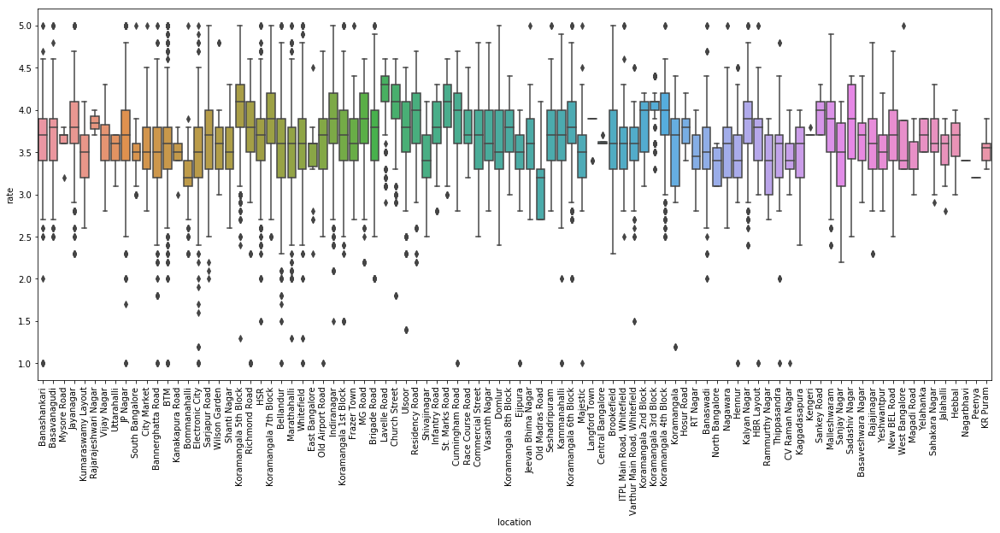

In [140]:
plt.figure(figsize=(20,8))
sns.boxplot(data['location'],data['rate'])
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91]), <a list of 92 Text xticklabel objects>)

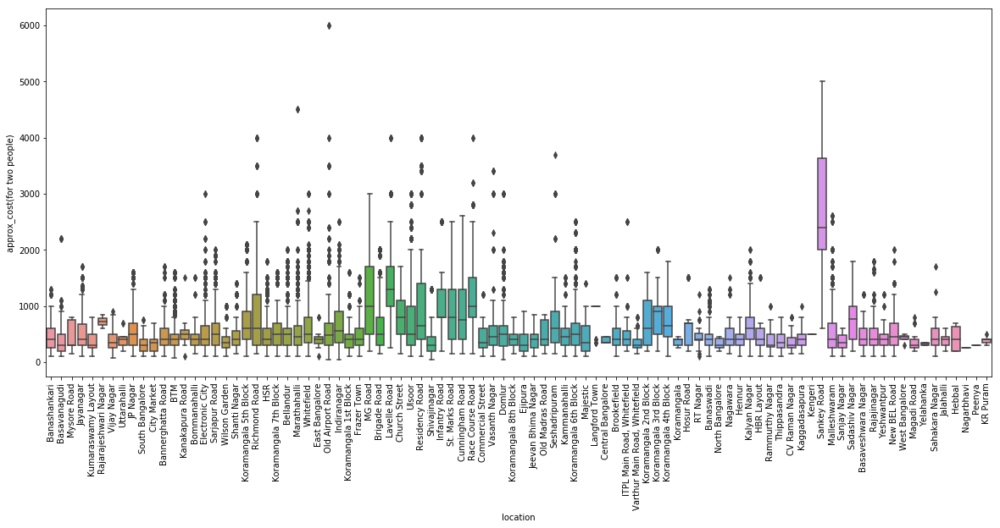

In [117]:
plt.figure(figsize=(20,8))
sns.boxplot(data['location'],data['approx_cost(for two people)'])
plt.xticks(rotation=90)

0.347620839661802


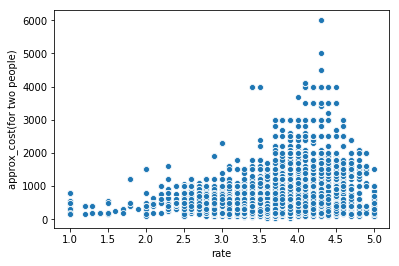

In [152]:
sns.scatterplot(data['rate'],data['approx_cost(for two people)'])
print(data['rate'].corr(data['approx_cost(for two people)']))

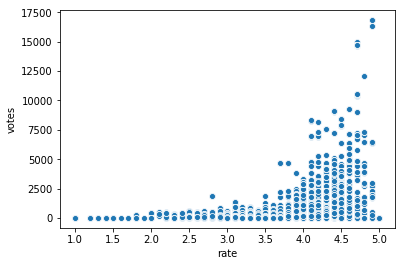

In [134]:
sns.scatterplot('rate','votes',data=data)

In [123]:
import plotly.express as px
fig = px.scatter(x='rate', y='votes',data_frame=data,hover_data=['name','location'])
fig.show()

In [108]:
import plotly.express as px
fig = px.scatter(x='rate', y='approx_cost(for two people)',data_frame=data,hover_data=['name','location'])
fig.show()

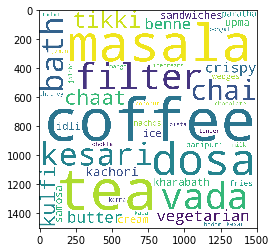

In [62]:
corpus=data[(data['rate']>4.5) & (data['approx_cost(for two people)']<200)]['dish_liked'].values.tolist()
#corpus
corpus=','.join(list_words  for list_words in corpus)
#print(corpus)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
plt.imshow(wordcloud)
wordcloud.to_file('value_for_money.png') 

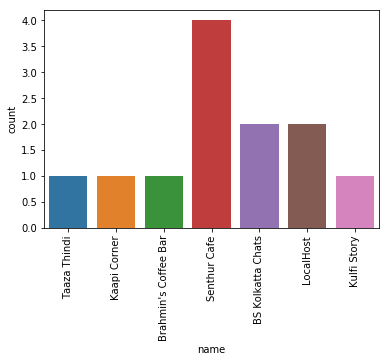

In [82]:
rest_name_value=sns.countplot(data[(data['rate']>4.5) & (data['approx_cost(for two people)']<150)]['name'])
plt.xticks(rotation=90)
rest_name_value.figure.savefig('rest_name_value.jpg', bbox_inches='tight') 

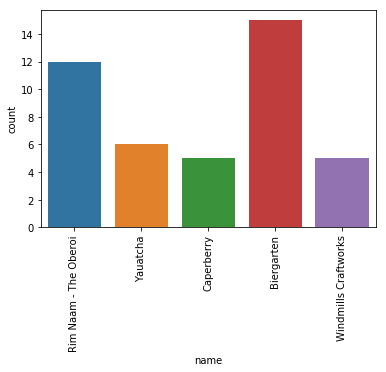

In [81]:
rest_name_exp=sns.countplot(data[(data['rate']>4.5) & (data['approx_cost(for two people)']>2000)]['name'])
plt.xticks(rotation=90)
rest_name_exp.figure.savefig('rest_name_exp.jpg', bbox_inches='tight') 

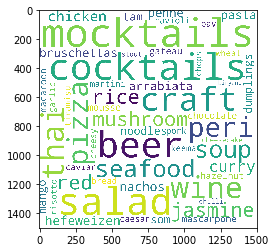

In [75]:
corpus=data[(data['rate']>4.5) & (data['approx_cost(for two people)']>2000)]['dish_liked'].values.tolist()
#corpus
corpus=','.join(list_words  for list_words in corpus)
#print(corpus)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
plt.imshow(wordcloud)
wordcloud.to_file('expensive than 2000.png') 

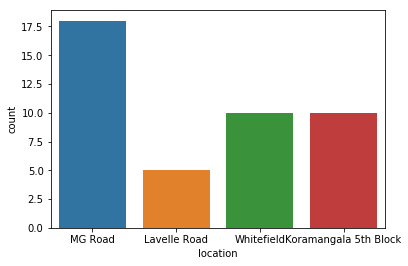

In [79]:
loc_name_exp=sns.countplot(data[(data['rate']>4.5) & (data['approx_cost(for two people)']>2000)]['location'])
loc_name_exp.figure.savefig('loc_name_exp.jpg') 

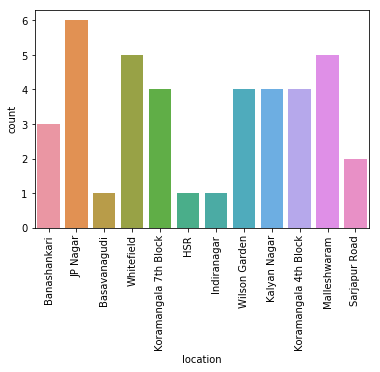

In [80]:
loc_name_value=sns.countplot(data[(data['rate']>4.5) & (data['approx_cost(for two people)']<200)]['location'])
plt.xticks(rotation=90)
loc_name_value.figure.savefig('loc_name_value.jpg' ,bbox_inches='tight') 

In [125]:
data[data.votes==data.votes.max()]

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),reviews_text,dish_n_review
49170,Byg Brewski Brewing Company,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"cocktails, butter chicken, dahi kebab, rajma c...","Continental, North Indian, Italian, South Indi...",1600,"[(Rated 5.0, RATED\n This is an absolute grea...",[],Delivery,Sarjapur Road,this is an absolute great place the service i...,"tiramisu, calamari, mutton, omelette, rice, dj..."
49627,Byg Brewski Brewing Company,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"cocktails, butter chicken, dahi kebab, rajma c...","Continental, North Indian, Italian, South Indi...",1600,"[(Rated 4.0, RATED\n Visiting a microbrewery ...",[],Dine-out,Sarjapur Road,visiting a microbrewery after a long time tri...,"calamari, mutton, rice, dj, mocktails, tikka, ..."
50059,Byg Brewski Brewing Company,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"cocktails, butter chicken, dahi kebab, rajma c...","Continental, North Indian, Italian, South Indi...",1600,"[(Rated 4.0, RATED\n Visiting a microbrewery ...",[],Drinks & nightlife,Sarjapur Road,visiting a microbrewery after a long time tri...,"tiramisu, calamari, mutton, rice, dj, mocktail..."


In [ ]:
sns.

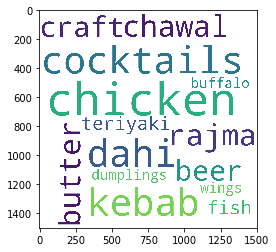

In [128]:
corpus=data[(data['name']=='Byg Brewski Brewing Company')]['dish_liked'].values.tolist()
#corpus
corpus=','.join(list_words  for list_words in corpus)
#print(corpus)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
plt.imshow(wordcloud)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87]), <a list of 88 Text xticklabel objects>)

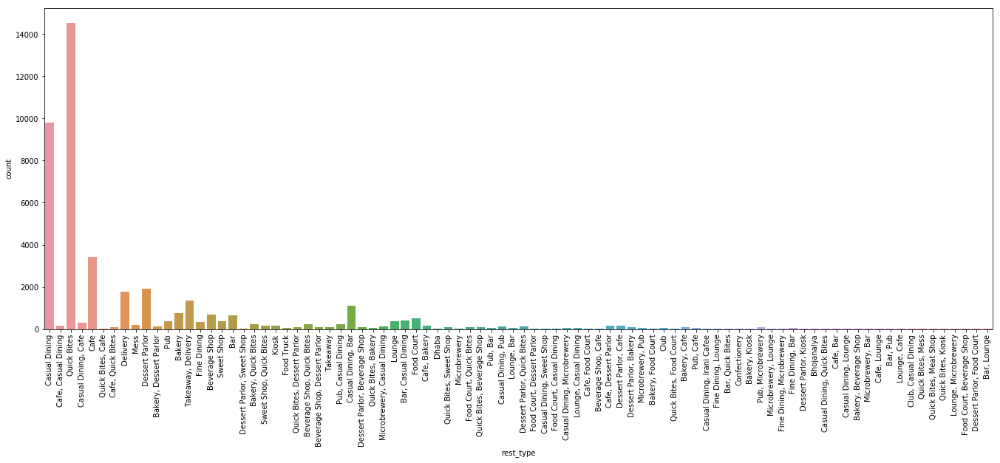

In [136]:
plt.figure(figsize=(23,8))
sns.countplot(data.rest_type)
plt.xticks(rotation=90)

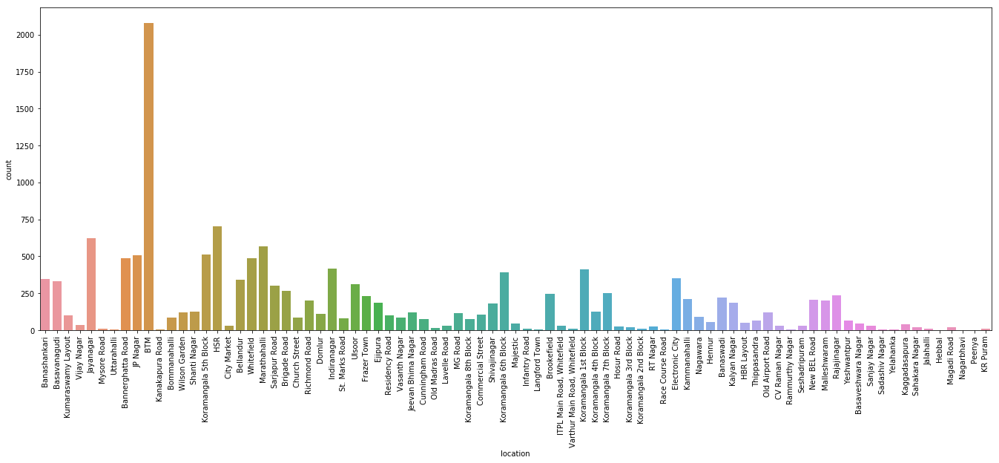

In [139]:
plt.figure(figsize=(23,8))
plt.xticks(rotation=90)
sns.countplot(data[data['rest_type']=='Quick Bites']['location'])

In [179]:
data[data.location=='Lavelle Road']

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),reviews_text,dish_n_review
4981,JW Kitchen - JW Marriott Bengaluru,No,Yes,4.4,2111,Lavelle Road,Fine Dining,"pasta, breakfast buffet, lasagne, salads, choc...","North Indian, Continental, Italian",2200,"[(Rated 5.0, RATED\n Great buffet spread\nOne...",[],Buffet,Brigade Road,great buffet spreadone of the best spread acro...,"tiramisu, mutton, rice, margarita, tikka, tea,..."
4987,Rasovara,Yes,Yes,4.3,763,Lavelle Road,Casual Dining,"thali, aamras, malpua, lassi, plain rice, butt...","Rajasthani, North Indian",1400,"[(Rated 5.0, RATED\n We went to Rasovara on J...",[],Buffet,Brigade Road,"we went to rasovara on january 1, as a nice wa...","buttermilk, jalebi, biryani, fries, thali, iml..."
4994,The Spice Bazaar,No,Yes,4.2,347,Lavelle Road,"Casual Dining, Bar","brownie, badam halwa, mutton seekh, salads, ra...","North Indian, Mughlai",1000,"[(Rated 4.0, RATED\n We went for team lunch.\...",[],Buffet,Brigade Road,we went for team lunch place is very good roof...,"salads, chaat, naan, vegetarian, fish, decor, ..."
4995,BBQ'D - Global Grill & Brewery,No,No,4.3,471,Lavelle Road,"Casual Dining, Microbrewery","butter chicken, chaat, dahipuri, beer, jalebi,...","BBQ, North Indian",1500,"[(Rated 4.0, RATED\n Yet another live barbecu...",[],Buffet,Brigade Road,"yet another live barbecue place, but this one ...","jalebi, rabri, biryani, prawn, hefeweizen, pas..."
5001,Cafe Mangii,Yes,Yes,4.3,1048,Lavelle Road,Casual Dining,"pasta, mocktails, tiramisu, sangria, mousse, m...","Italian, Continental, Pizza",1600,"[(Rated 4.0, RATED\n The place at UB city has...",[],Buffet,Brigade Road,the place at ub city has a really chill vibe ...,"sangria, gnocchi, pasta, ravioli, falafel, bur..."
5009,South Parade - The Chancery Hotel,No,No,3.1,120,Lavelle Road,"Casual Dining, Bar","breakfast buffet, salads","North Indian, Continental, Chinese",1200,"[(Rated 3.0, RATED\n Buffet spread was enough...",[],Buffet,Brigade Road,buffet spread was enough for lunch service wa...,"salads, biryani, kheer, sandwiches, manchurian..."
5048,Glen's Bakehouse,Yes,No,4.4,1084,Lavelle Road,"Bakery, Cafe","pizza, coffee, pasta, tiramisu, cheesecake, ho...","Bakery, Cafe, Italian, Desserts",600,"[(Rated 4.0, RATED\n Glen's bakehouse- ask an...","['Cheesy Chicken Bake', 'Barbecue Chicken Fron...",Cafes,Brigade Road,glen's bakehouse- ask anyone who is living in ...,"lamb, rolls, pie, tea, chicken, primavera, pas..."
5051,Bengaluru Baking Company - JW Marriott Bengaluru,No,No,4.3,521,Lavelle Road,"Bakery, Cafe","coffee, fruit tart, croissants, eclair, sandwi...","Salad, Bakery, Cafe, Sandwich, Italian, Burger",1400,"[(Rated 5.0, RATED\n For some rich creamy yum...",[],Cafes,Brigade Road,for some rich creamy yummy cakes bbc is the pl...,"tiramisu, prawn, salads, truffle, latte, bread..."
5070,The Blackboard Bakery,No,Yes,3.7,91,Lavelle Road,"Cafe, Bakery","pancakes, sandwich, salad, coffee, burgers","Cafe, Bakery, Continental",1000,"[(Rated 1.0, RATED\n This place has got to be...",[],Cafes,Brigade Road,this place has got to be the worst cafe i've b...,"omelette, decor, eggs"
5073,Fresh Pressery Cafe,No,No,4.1,104,Lavelle Road,"Cafe, Quick Bites","salads, sandwiches, arugula salad, pasta, avoc...","Cafe, Italian, Healthy Food",1200,"[(Rated 1.0, RATED\n The food is not fresh an...",[],Cafes,Brigade Road,the food is not fresh and the salad tastes bad...,salad


In [186]:
data[(data.rate<=3.0)]['rate'].count()

3777

In [187]:
data[(data.rate>3.0) & (data.rate<=4.0)]['rate'].count()

29335

In [188]:
data[(data.rate>4.0) & (data.rate<=5.0)]['rate'].count()

9744

In [226]:
def rateconvert(x):
    if x<=3.0:
        return 0
    elif (x>3.0) and (x<=4.0):
        return 1
    else:
        return 2

In [ ]:
mod=data.copy()

In [223]:
mod=data[['online_order','book_table','approx_cost(for two people)','votes','location','rest_type','rate']].copy()

In [224]:
mod.dropna(inplace=True)

In [225]:
mod.isnull().sum()

online_order                   0
book_table                     0
approx_cost(for two people)    0
votes                          0
location                       0
rest_type                      0
rate                           0
dtype: int64

In [227]:
mod['online_order']=mod['online_order'].map({'Yes':1,'No':0}).astype(int)
mod['book_table']=mod['book_table'].map({'Yes':1,'No':0}).astype(int)

In [228]:
mod['approx_cost(for two people)']=mod['approx_cost(for two people)'].apply(lambda x:x.replace(',','')).astype(int)

In [230]:
mod['rate']=mod['rate'].apply(rateconvert)

In [242]:
mod['rate']=mod['rate'].astype(int)

In [235]:
basmod=pd.get_dummies(mod.iloc[:,:-1])

In [243]:
X=basmod
y=mod['rate']

In [244]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [260]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=42,max_depth=45)

In [256]:
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier

In [269]:
dt=clf.fit(X_train,y_train)
ypred=dt.predict(X_test)
print(classification_report(y_test,ypred,labels=[0,1,2]))

              precision    recall  f1-score   support

           0       0.85      0.82      0.84      1244
           1       0.96      0.97      0.97      9594
           2       0.96      0.94      0.95      3256

    accuracy                           0.95     14094
   macro avg       0.93      0.91      0.92     14094
weighted avg       0.95      0.95      0.95     14094



In [3]:
dt=pd.DataFrame(data={'Precision':[0.86,0.91,0.92,0.92,0.88,'',0.90,0.91],'Recall':[0.84,0.90,0.92,0.93,0.85,'',0.89,0.91],'F1-score':[0.85,0.90,0.92,0.93,0.86,0.91,0.89,0.91],'Support':[647,2316,4552,2727,433,10675,10675,10675]},index=['0','1','2','3','4','Accuracy','Macro average','Weighted average'])

In [4]:
dt.iloc[5,2]

0.91

In [5]:
def style_specific_cell(x):

    color1 = 'background-color: lightgreen'
    color2 = 'background-color: yellow'
    color3 = 'background-color: turquoise'
    color4 = 'background-color: orange'
    color5 = 'background-color: pink'
    df1 = pd.DataFrame('', index=x.index, columns=x.columns)
    df1.iloc[0, 2] = color1
    df1.iloc[1, 2] = color2
    df1.iloc[2, 2] = color3
    df1.iloc[3, 2] = color4
    df1.iloc[4, 2] = color5
    df1.iloc[5, 2] = color2
    return df1

dt.style.apply(style_specific_cell, axis=None)

,Precision,Recall,F1-score,Support
0,0.86,0.84,0.85,647
1,0.91,0.9,0.9,2316
2,0.92,0.92,0.92,4552
3,0.92,0.93,0.93,2727
4,0.88,0.85,0.86,433
Accuracy,,,0.91,10675
Macro average,0.9,0.89,0.89,10675
Weighted average,0.91,0.91,0.91,10675


In [266]:
rf=RandomForestClassifier(random_state=42,n_estimators=101,class_weight='balanced')
rff=rf.fit(X_train,y_train)
ypred=rff.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.89      0.86      0.88      1244
           1       0.97      0.98      0.98      9594
           2       0.97      0.95      0.96      3256

    accuracy                           0.96     14094
   macro avg       0.95      0.93      0.94     14094
weighted avg       0.96      0.96      0.96     14094



In [32]:
random=pd.DataFrame(data={'Precision':[0.89,0.97,0.97,' ',0.95,0.96],'Recall':[0.86,0.98,0.95,' ',0.93,0.96],'F1-score':[0.88,0.98,0.96,0.96,0.94,0.96],'Support':[1244,9594,3256,14094,14094,14094]},index=['Low','Medium','High','Accuracy','Macro average','Weighted average'])

In [34]:
random.style.apply(style_specific_cell, axis=None)

,Precision,Recall,F1-score,Support
Low,0.89,0.86,0.88,1244
Medium,0.97,0.98,0.98,9594
High,0.97,0.95,0.96,3256
Accuracy,,,0.96,14094
Macro average,0.95,0.93,0.94,14094
Weighted average,0.96,0.96,0.96,14094


In [265]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,ypred))

[[1048  177   19]
 [  83 9442   69]
 [  28  135 3093]]


In [267]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,ypred))

[[1076  153   15]
 [ 107 9421   66]
 [  26  129 3101]]
